# Spacecraft


## Model description

Spacecraft rendezvous is a perfect use case for formal veriﬁcation of hybrid
systems with nonlinear dynamics since mission failure can cost lives and is
extremely expensive. This benchmark is taken from [1].

The nonlinear dynamic equations describe the two-dimensional, planar motion of
the space-craft on an orbital plane towards a space station:

$$
  \left\{ \begin{array}{lcl}
  \dot{x} & = & v_x \\
  \dot{y} & = & v_y \\
  \dot{v_x} & = & n^2x + 2nv_y + \frac{\mu}{r^2} - \frac{\mu}{r^3} (r +x) + \frac{u_x}{m_c} \\
  \dot{v_y} & = & n^2y - 2nv_x - \frac{\mu}{r^3_c}y + \frac{u_y}{m_c}
  \end{array} \right.
$$

The model consists of position (relative to the target) ``x``, ``y`` [m], time
``t`` [min], as well as horizontal and vertical velocity ``v_x``, ``v_y`` [m / min].
The parameters are ``µ = 3.986 × 10^{14} × 60^2`` [``m^3 / min^2``],
``r = 42164 × 10^3 [m], m_c = 500 [kg], n = \sqrt{\frac{\mu}{r^3}}`` and
``r_c = \sqrt{(r + x)^2 + y^2}``.

The hybrid nature of this benchmark originates from a switched controller. In
particular, the modes are approaching (``x ∈ [−1000, −100] [m]``), rendezvous
attempt (``x ≥ −100 [m]``), and aborting. A transition to mode aborting occurs
nondeterministically at ``t ∈ [120, 150] [min]``.

The linear feedback controllers for the diﬀerent modes are deﬁned as
``\binom{u_x}{u_y} = K_1\underline{x}`` for mode approaching, and
``\binom{u_x}{u_y} = K_2\underline{x}`` for mode rendezvous attempt, where
``\underline{x} = (x, y, v_x, v_y)^T`` is the vector of system states. The
feedback matrices ``K_i`` were determined with an LQR-approach applied to the
linearized system dynamics, which resulted in the following numerical values:
$$
K_1 =
\begin{pmatrix}
−28.8287 & 0.1005 & −1449.9754 & 0.0046 \\
−0.087 & −33.2562 & 0.00462 & −1451.5013
\end{pmatrix}
$$
$$
K_2 =
\begin{pmatrix}
−288.0288 & 0.1312 & −9614.9898 & 0 \\
−0.1312 & −288 & 0 & −9614.9883
\end{pmatrix}
$$
In the mode aborting, the system is uncontrolled ``\binom{u_x}{u_y} = \binom{0}{0}``.

In [1]:
using ReachabilityAnalysis

const μ = 3.986e14 * 60^2
const r = 42164.0e3
const r² = r^2
const mc = 500.0
const n² = μ / r^3
const n = sqrt(n²)

const two_n = 2*n
const μ_r² = μ/r²;

In [2]:
const K₁ = [-28.8287 0.1005 -1449.9754 0.0046 0.0;
            -0.087 -33.2562 0.00462 -1451.5013 0.0]
const K₂ = [-288.0288 0.1312 -9614.9898 0.0 0.0;
            -0.1312 -288.0 0.0 -9614.9883   0.0]

const K₁mc = K₁/mc
const K₂mc = K₂/mc

function mymul!(v, A, x)
    @inbounds for ind = 1:length(v)
        v[ind] = zero(x[1])
        for jind = 1:length(x)
            v[ind] += A[ind, jind] * x[jind]
        end
    end
    return nothing
end

mymul! (generic function with 1 method)

### Dynamics in the 'approaching' mode

In [3]:
@taylorize function spacecraft_approaching!(du, u, p, t)
    x, y, vx, vy, t = u

    rx = r + x
    rx² = rx^2
    y² = y^2
    rc = sqrt(rx² + y²)
    rc³ = rc^3
    μ_rc³ = μ / rc³

    uxy = Vector{typeof(x)}(undef, 2)
    mymul!(uxy, K₁mc, u)

    # x' = vx
    du[1] = vx

    # y' = vy
    du[2] = vy

    # vx' = n²x + 2n*vy + μ/(r^2) - μ/(rc^3)*(r+x) + ux/mc
    du[3] = (n²*x + two_n*vy) + ((μ_r² - μ_rc³*rx) + uxy[1])

    # vy' = n²y - 2n*vx - μ/(rc^3)y + uy/mc
    du[4] = (n²*y - two_n*vx) - (μ_rc³*y - uxy[2])

    # t' = 1
    du[5] = one(x)

    return du
end

### Dynamics in the 'rendezvous attempt' mode

In [4]:
@taylorize function spacecraft_attempt!(du, u, p, t)
    x, y, vx, vy, t = u

    rx = r + x
    rx² = rx^2
    y² = y^2
    rc = sqrt(rx² + y²)
    rc³ = rc^3
    μ_rc³ = μ / rc³

    uxy = Vector{typeof(x)}(undef, 2)
    mymul!(uxy, K₂mc, u)

    # x' = vx
    du[1] = vx

    # y' = vy
    du[2] = vy

    # vx' = n²x + 2n*vy + μ/(r^2) - μ/(rc^3)*(r+x) + ux/mc
    du[3] = (n²*x + two_n*vy) + ((μ_r² - μ_rc³*rx) + uxy[1])

    # vy' = n²y - 2n*vx - μ/(rc^3)y + uy/mc
    du[4] = (n²*y - two_n*vx) - (μ_rc³*y - uxy[2])

    # t' = 1
    du[5] = one(x)

    return du
end

### Dynamics in the 'aborting' mode

In [5]:
@taylorize function spacecraft_aborting!(du, u, p, t)
    x, y, vx, vy, t = u

    rx = r + x
    rx² = rx^2
    y² = y^2
    rc = sqrt(rx² + y²)
    rc³ = rc^3
    μ_rc³ = μ / rc³

    # x' = vx
    du[1] = vx

    # y' = vy
    du[2] = vy

    # vx' = n²x + 2n*vy + μ/(r^2) - μ/(rc^3)*(r+x)
    du[3] = (n²*x + two_n*vy) + (μ_r² - μ_rc³*rx)

    # vy' = n²y - 2n*vx - μ/(rc^3)y
    du[4] = (n²*y - two_n*vx) - μ_rc³*y

    # t' = 1
    du[5] = one(x)

    return du
end

### Hybrid System setup

To model the system as a hybrid automaton, it is useful to work with symbolic
state variables.

In [6]:
using Symbolics

const var = @variables x y vx vy t

function spacecraft(; abort_time=(120.0, 150.0))

    n = 4 + 1  # number of variables
    t_abort_lower, t_abort_upper = abort_time

    automaton = LightAutomaton(3)

    # mode 1 "approaching"
    invariant = HalfSpace(x <= -100, var)
    approaching = @system(x' = spacecraft_approaching!(x), dim:5, x ∈ invariant)

    # mode 2 "rendezvous attempt"
    invariant = HalfSpace(x >= -100, var)
    attempt = @system(x' = spacecraft_attempt!(x), dim:5, x ∈ invariant)

    # mode 3 "aborting"
    invariant = Universe(n)
    aborting = @system(x' = spacecraft_aborting!(x), dim: 5, x ∈ invariant)

    # transition "approach" -> "attempt"
    add_transition!(automaton, 1, 2, 1)
    guard = HalfSpace(x >= -100, var)
    t1 = @map(x -> x, dim: n, x ∈ guard)

    # transition "approach" -> "abort"
    add_transition!(automaton, 1, 3, 2)
    guard_time = HPolyhedron([t >= t_abort_lower, t <= t_abort_upper], var)
    t2 = @map(x -> x, dim: n, x ∈ guard_time)

    # transition "attempt" -> "abort"
    add_transition!(automaton, 2, 3, 3)
    t3 = @map(x -> x, dim: n, x ∈ guard_time)

    H = HybridSystem(automaton=automaton,
                     modes=[approaching, attempt, aborting],
                     resetmaps=[t1, t2, t3])

     # initial condition in mode 1
     X0 = Hyperrectangle([-900., -400., 0., 0., 0.], [25., 25., 0., 0., 0.])
     init = [(1, X0)]

     return InitialValueProblem(H, init)
end

spacecraft (generic function with 1 method)

## Reachability settings

The spacecraft starts from the initial set ``x ∈ [−925, −875] [m]``,
``y ∈ [−425, −375] [m], vx = 0 [m/min]`` and ``vy = 0 [m/min]``. For the
considered time horizon of ``t ∈ [0, 200] [min]``, the following speciﬁcations
have to be satisﬁed:

- Line-of-sight: In mode rendezvous attempt, the spacecraft has to stay
     inside line-of-sight cone ``L = {\binom{x}{y} | (x ≥ −100) ∧ (y ≥ x \tan(30°)) ∧ (−y ≥ x \tan(30°))}``.

- Collision avoidance: In mode aborting, the spacecraft has to avoid a
     collision with the target, which is modeled as a box ``B`` with ``0.2m``
     edge length and the center placed at the origin.

- Velocity constraint: In mode rendezvous attempt, the absolute velocity
     has to stay below ``3.3 [m/min]``: ``\sqrt{v^2_x + v^2_y} ≤ 3.3 [m/min]``.

!!! note "Remark on velocity constraint"
    In the original benchmark [1], the constraint
    on the velocity was set to 0.05 m/s, but it can be shown (by a counterexample)
    that this constraint cannot be satisﬁed. We therefore use the relaxed
    constraint ``0.055 [m/s] = 3.3 [m/min]``.

In [7]:
const tan30 = tand(30)

LineOfSightCone = HPolyhedron([x >= -100, y >= x*tan30, -y >= x*tan30], var)

Target = Hyperrectangle(zeros(2), [0.2, 0.2]);

### Auxiliary functions

In [8]:
function line_of_sight(sol)
    all_idx = findall(x -> x == 2, location.(sol))  # attempt
    for idx in all_idx
        verif = all(set(R) ⊆ LineOfSightCone for R in sol[idx][2:end])
        !verif && return false
    end
    return true
end

function absolute_velocity(R)
    vx, vy = 3, 4
    vx2 = set(overapproximate(project(R, vars=(vx,)), Interval))
    vy2 = set(overapproximate(project(R, vars=(vy,)), Interval))
    return sqrt(vx2.dat + vy2.dat)
end

function velocity_constraint(sol)
    all_idx = findall(x -> x == 2, location.(sol)) # attempt mode
    for idx in all_idx
        # maximum velocity measured in m/min
        verif = all(absolute_velocity(R) < 0.055 * 60. for R in sol[idx])
        !verif && return false
    end
    return true
end

function target_avoidance(sol)
    all_idx = findall(x -> x == 3, location.(sol)) # aborting mode
    for idx in all_idx
        verif = all(is_intersection_empty(set(Projection(R, [x, y])), Target) for R in sol[idx])
        !verif && return false
    end
    return true
end

target_avoidance (generic function with 1 method)

## Results

We used ``n_Q = 1`` and ``n_T = 5``. The transition to the aborting mode is
handled by clustering the flowpipe into 29 boxes.

In [9]:
using Plots

function solve_spacecraft(prob; k=25, s=missing)

    # template directions
    boxdirs = BoxDirections(5)

    # transition from mode 1 to mode 2
    sol12 = solve(prob,
                tspan=(0.0, 200.0),
                alg=TMJets20(abstol=1e-5, maxsteps=10_000, orderT=5, orderQ=1, disjointness=BoxEnclosure()),
                max_jumps=1,
                intersect_source_invariant=false,
                intersection_method=TemplateHullIntersection(boxdirs),
                clustering_method=LazyClustering(1),
                disjointness_method=BoxEnclosure())

    sol12jump = overapproximate(sol12[2](120 .. 150), Zonotope)
    t0 = tstart(sol12jump[1])
    sol12jump_c = cluster(sol12jump, 1:length(sol12jump), BoxClustering(k, s))

    # transition from mode 2 to mode 3
    H = system(prob)
    sol3 = solve(IVP(mode(H, 3), [set(X) for X in sol12jump_c]),
                 tspan=(t0, 200.0),
                 alg=TMJets20(abstol=1e-10, orderT=7, orderQ=1, disjointness=BoxEnclosure()))
    d = Dict{Symbol, Any}(:loc_id => 3)

    F12 = [fp for fp in sol12.F]
    F23 = [Flowpipe(fp.Xk, d) for fp in sol3.F]
    return HybridFlowpipe(vcat(F12, F23))
end

prob = spacecraft()
sol = solve_spacecraft(prob; k=25, s=missing)
solz = overapproximate(sol, Zonotope);

┌ Warning: maximum number of jumps reached; try increasing `max_jumps`
└ @ ReachabilityAnalysis /home/runner/work/ReachabilityAnalysis.jl/ReachabilityAnalysis.jl/src/Hybrid/solve.jl:144


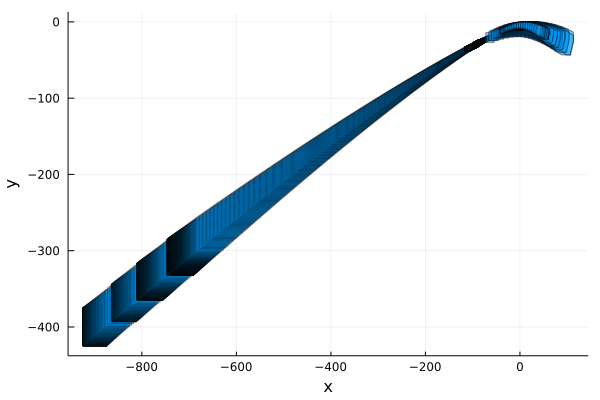

In [10]:
plot(solz, vars=(1, 2), xlab="x", ylab="y")

Note that in the previous plot, it is not specified which reach-set corresponds to
which mode. After finding the location (mode of the hybrid system) associated
to each reach-set of the solution, we can plot each one using different colors.
The plotting code is more sophisticated than before, but is an example of finer
control of the options used to plot the flowpipes.

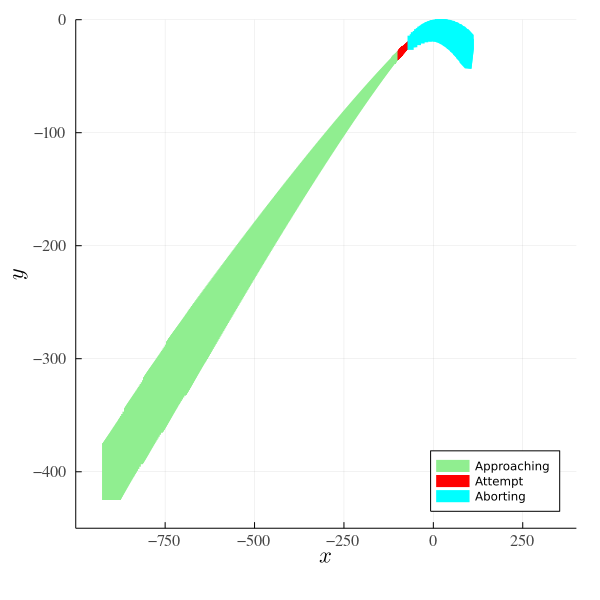

In [11]:
idx_approaching = findall(x -> x == 1, location.(solz))
idx_attempt = findall(x -> x == 2, location.(solz))
idx_aborting = findall(x -> x == 3, location.(solz))

using Plots, Plots.PlotMeasures, LaTeXStrings

fig = plot(legend=:bottomright, tickfont=font(10, "Times"), guidefontsize=15,
           xlab=L"x", ylab=L"y", lw=0.0,
           xtick=[-750, -500, -250, 0, 250.], ytick=[-400, -300, -200, -100, 0.],
           xlims=(-1000.0, 400.0), ylims=(-450.0, 0.0), size=(600, 600),
           bottom_margin=6mm, left_margin=2mm, right_margin=4mm, top_margin=3mm)

plot!(fig, solz[idx_approaching[1]], vars=(1, 2), lw=0.0, color=:lightgreen, alpha=1., lab="Approaching")
for k in 2:length(idx_approaching)
    plot!(fig, solz[idx_approaching[k]], vars=(1, 2), lw=0.0, color=:lightgreen, alpha=1.)
end

plot!(fig, solz[idx_attempt[1]], vars=(1, 2), lw=0.0, color=:red, alpha=1., lab="Attempt")
for k in 2:length(idx_attempt)
    plot!(fig, solz[idx_attempt[k]], vars=(1, 2), lw=0.0, color=:red, alpha=1.)
end

plot!(fig, solz[idx_aborting[1]], vars=(1, 2), lw=0.0, color=:cyan, alpha=1., lab="Aborting")
for k in 2:length(idx_aborting)
    plot!(fig, solz[idx_aborting[k]], vars=(1, 2), lw=0.0, color=:cyan, alpha=1.)
end

fig

## References

[1] N. Chan and S. Mitra. *Verifying safety of an autonomous spacecraft
rendezvous mission.* In ARCH17. 4th International Workshop on Applied
Veriﬁcation of Continuous and Hybrid Systems, collocated with Cyber-Physical
Systems Week (CPSWeek) on April 17, 2017 in Pittsburgh, PA, USA, pages 20–32, 2017.